<a href="https://colab.research.google.com/github/riotrip/ml-smt5/blob/main/Kuis2_Kel4_HoG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Kuis 2 - Kelompok 4 (HoG)**
---
## **Rio Tri Prayogo - 2341720236 - TI 3F/25**

## Load Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog

In [3]:
def load_dataset(img_dir):
    img_list = []
    for file_path in Path(img_dir).rglob('*.jpg'):
        img = cv2.imread(str(file_path))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label = file_path.parent.name
            img_list.append((img, label))

    print(f"Loaded {len(img_list)} images")
    return img_list

In [4]:
df_dir = '/content/drive/MyDrive/PembelajaranMesin_Rio/kuis2/Vegetable Images/train/'

In [5]:
df = load_dataset(df_dir)

Loaded 15049 images


In [6]:
def random_img_viz(img_list):
    if len(img_list) == 0:
        print("No images to display")
        return

    idx = np.random.randint(0, len(img_list))
    img, label = img_list[idx]

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Label: {label}\nShape: {img.shape}')


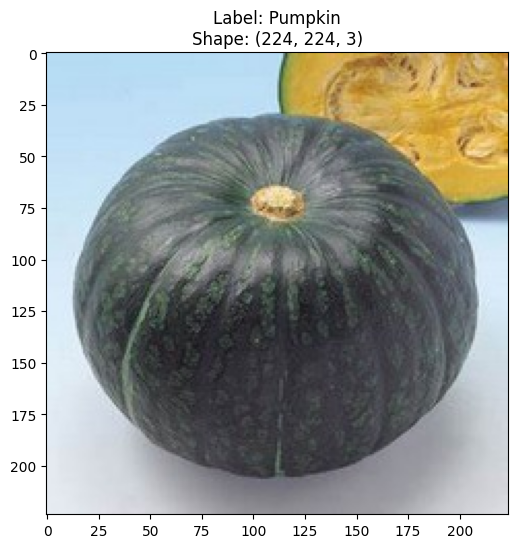

In [7]:
random_img_viz(df)

## Proses Pra Pengolahan Data

In [8]:
preprocessed = []
for img, label in df:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    enhanced = cv2.createCLAHE().apply(gray)
    denoised = cv2.medianBlur(enhanced, 3)
    preprocessed.append((denoised, label))

In [9]:
print(f"Preprocessed {len(preprocessed)} images")

Preprocessed 15049 images


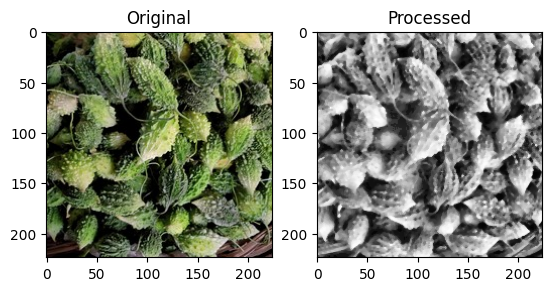

In [10]:
idx = np.random.randint(0, len(df))
plt.subplot(1,2,1).imshow(df[idx][0]), plt.title('Original')
plt.subplot(1,2,2).imshow(preprocessed[idx][0], cmap='gray'), plt.title('Processed')
plt.show()

## Ekstraksi Fitur

In [11]:
def extract_hog_features(images):
    features = []
    labels = []
    for img, label in images:
        # Convert to grayscale if needed
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            gray = img

        # Resize and extract HoG
        resized = cv2.resize(gray, (128, 128))
        hog_feat = hog(resized,
                      pixels_per_cell=(16, 16),
                      cells_per_block=(2, 2),
                      orientations=9,
                      block_norm='L2-Hys')
        features.append(hog_feat)
        labels.append(label)

    return np.array(features), labels

In [12]:
features, labels = extract_hog_features(preprocessed)

In [13]:
features

array([[0.23934442, 0.20953126, 0.21594177, ..., 0.11536902, 0.13335248,
        0.22436969],
       [0.09916417, 0.0433208 , 0.05916848, ..., 0.14608575, 0.07120564,
        0.18810972],
       [0.1751117 , 0.11461056, 0.05121406, ..., 0.10529302, 0.11649308,
        0.07545259],
       ...,
       [0.23093652, 0.07691094, 0.12901567, ..., 0.07939773, 0.19361111,
        0.29178916],
       [0.12933759, 0.07490909, 0.24932846, ..., 0.05204087, 0.10007919,
        0.12866936],
       [0.24631363, 0.25089655, 0.25089655, ..., 0.26640549, 0.05618419,
        0.07211773]])

## Reduksi Dimensi

In [14]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)  # mempertahankan 95% informasi
feats_pca = pca.fit_transform(features)

In [15]:
feats_pca

array([[-7.09750895e-01, -3.32386514e-01,  1.13786231e+00, ...,
        -3.01729801e-02, -3.83648763e-02, -4.73062546e-02],
       [-7.68357942e-01, -3.66280007e-01,  5.52701581e-01, ...,
         3.63926563e-02,  6.95907426e-02,  1.40826423e-04],
       [ 9.57273519e-01, -3.76597065e-01,  1.30533474e-01, ...,
        -5.20119379e-02,  1.04694177e-03, -2.08193245e-02],
       ...,
       [ 2.59325535e+00,  1.63623275e-01,  1.15740553e+00, ...,
        -1.02378895e-01, -1.85152056e-02,  1.43313861e-02],
       [-9.15493356e-01, -1.17962884e+00,  8.45134469e-01, ...,
         4.67998649e-02,  6.95864976e-03,  8.68256096e-02],
       [-5.31733055e-01, -1.18505852e+00,  1.19100210e+00, ...,
        -1.73255555e-02, -8.31064212e-03, -2.48022553e-02]])

## Split Data

In [16]:
final_dataset = list(zip(feats_pca, labels))

In [17]:
final_dataset

[(array([-7.09750895e-01, -3.32386514e-01,  1.13786231e+00, -4.57748173e-01,
          3.30209771e-01,  3.14476779e-01,  1.45540175e-01,  4.09735422e-01,
         -5.04539687e-01,  1.75908381e-01, -3.87166228e-02, -3.23198259e-01,
         -8.74823461e-01,  7.51057074e-01,  4.87345255e-01,  6.20146705e-01,
         -5.72637198e-01,  8.47251046e-02, -3.57494046e-02, -1.47519121e-01,
         -1.38430308e-02,  7.61303931e-02,  2.67852048e-01, -1.20815344e-01,
          3.75468415e-02, -3.53706280e-01, -4.37206019e-01,  1.30270963e-01,
          4.08627271e-01, -1.75501719e-01,  2.73883112e-04, -1.54636515e-01,
         -2.11425871e-01,  1.27187111e-01,  5.57396904e-02,  6.10675842e-02,
         -2.98790057e-02,  6.53936131e-02,  1.62283519e-01, -3.45414647e-01,
          9.40462152e-02,  1.48241545e-01, -4.71852254e-01, -3.78051705e-01,
         -1.69774786e-01,  1.01697088e-01, -2.30347562e-01, -2.33494048e-01,
          5.33363399e-02, -1.37317011e-01,  2.12862687e-01, -3.18983712e-01,

In [18]:
X, y = zip(*final_dataset)

X = np.array(X)
y = np.array(y)

In [19]:
from sklearn.model_selection import train_test_split

X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
    X, y,
    test_size=0.30,
    random_state=0,
    stratify=y
)

In [20]:
X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
    X, y,
    test_size=0.20,
    random_state=0,
    stratify=y
)

In [21]:
X_train_90, X_test_10, y_train_90, y_test_10 = train_test_split(
    X, y,
    test_size=0.10,
    random_state=0,
    stratify=y
)

In [22]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

## Pembuatan Model

In [23]:
splits = {
    "30": (X_train_70, X_test_30, y_train_70, y_test_30),
    "20": (X_train_80, X_test_20, y_train_80, y_test_20),
    "10": (X_train_90, X_test_10, y_train_90, y_test_10)
}

In [24]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate(model, X_train, X_test, y_train, y_test):
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    return {
        "train_accuracy": accuracy_score(y_train, pred_train),
        "test_accuracy": accuracy_score(y_test, pred_test),
        "precision": precision_score(y_test, pred_test, average='weighted'),
        "recall": recall_score(y_test, pred_test, average='weighted'),
        "f1": f1_score(y_test, pred_test, average='weighted'),
    }


In [25]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import pickle

def build_svm(Xtr, ytr, Xts, yts, split_name):
    svm = SVC(kernel='rbf', C=10, gamma='scale')
    svm.fit(Xtr, ytr)

    result = evaluate(svm, Xtr, Xts, ytr, yts)

    # tambah info model
    result["model_object"] = svm
    result["split"] = split_name
    return result

In [26]:
from sklearn.neighbors import KNeighborsClassifier

def build_knn(Xtr, ytr, Xts, yts, split_name):
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(Xtr, ytr)

    result = evaluate(knn, Xtr, Xts, ytr, yts)
    result["model_object"] = knn
    result["split"] = split_name
    return result


In [27]:
from sklearn.naive_bayes import GaussianNB

def build_nb(Xtr, ytr, Xts, yts, split_name):
    nb = GaussianNB()
    nb.fit(Xtr, ytr)

    result = evaluate(nb, Xtr, Xts, ytr, yts)
    result["model_object"] = nb
    result["split"] = split_name
    return result

In [28]:
models_30 = {}
models_20 = {}
models_10 = {}

for split_name, (Xtr, Xts, ytr, yts) in splits.items():

    print(f"\n=== Membuat model untuk split {split_name}% ===")

    if split_name == "30":
        models_30["svm"] = build_svm(Xtr, ytr, Xts, yts, "30")
        models_30["knn"] = build_knn(Xtr, ytr, Xts, yts, "30")
        models_30["nb"]  = build_nb (Xtr, ytr, Xts, yts, "30")

    elif split_name == "20":
        models_20["svm"] = build_svm(Xtr, ytr, Xts, yts, "20")
        models_20["knn"] = build_knn(Xtr, ytr, Xts, yts, "20")
        models_20["nb"]  = build_nb (Xtr, ytr, Xts, yts, "20")

    elif split_name == "10":
        models_10["svm"] = build_svm(Xtr, ytr, Xts, yts, "10")
        models_10["knn"] = build_knn(Xtr, ytr, Xts, yts, "10")
        models_10["nb"]  = build_nb (Xtr, ytr, Xts, yts, "10")



=== Membuat model untuk split 30% ===

=== Membuat model untuk split 20% ===

=== Membuat model untuk split 10% ===


In [29]:
import pickle

def save_all_models(model_dict, prefix):
    for name, model in model_dict.items():
        filename = f"{prefix}_{name}.pkl"
        pickle.dump(model["model"], open(filename, "wb"))
        print(f"✔ Model {prefix}_{name} disimpan.")

In [30]:
def collect_results(models_dict, split_name):
    rows = []
    for clf_name, result in models_dict.items():
        rows.append({
            "Split": split_name,
            "Model": clf_name.upper(),
            "Train Accuracy": result["train_accuracy"],
            "Test Accuracy": result["test_accuracy"],
            "Precision": result["precision"],
            "Recall": result["recall"],
            "F1": result["f1"]
        })
    return rows

In [31]:
all_results = []
all_results += collect_results(models_30, "30")
all_results += collect_results(models_20, "20")
all_results += collect_results(models_10, "10")

df_results = pd.DataFrame(all_results)
df_results


,Split,Model,Train Accuracy,Test Accuracy,Precision,Recall,F1
0,30,SVM,1.000000,0.859358,0.860882,0.859358,0.859331
1,30,KNN,0.819727,0.713178,0.832940,0.713178,0.737646
2,30,NB,0.681128,0.578959,0.589796,0.578959,0.578228
3,20,SVM,1.000000,0.872093,0.873549,0.872093,0.872170
4,20,KNN,0.832378,0.735548,0.839060,0.735548,0.756020
5,20,NB,0.670654,0.596013,0.605622,0.596013,0.595133
6,10,SVM,1.000000,0.878405,0.881913,0.878405,0.878965
7,10,KNN,0.841849,0.740199,0.843920,0.740199,0.760489
8,10,NB,0.664427,0.596678,0.605569,0.596678,0.594834


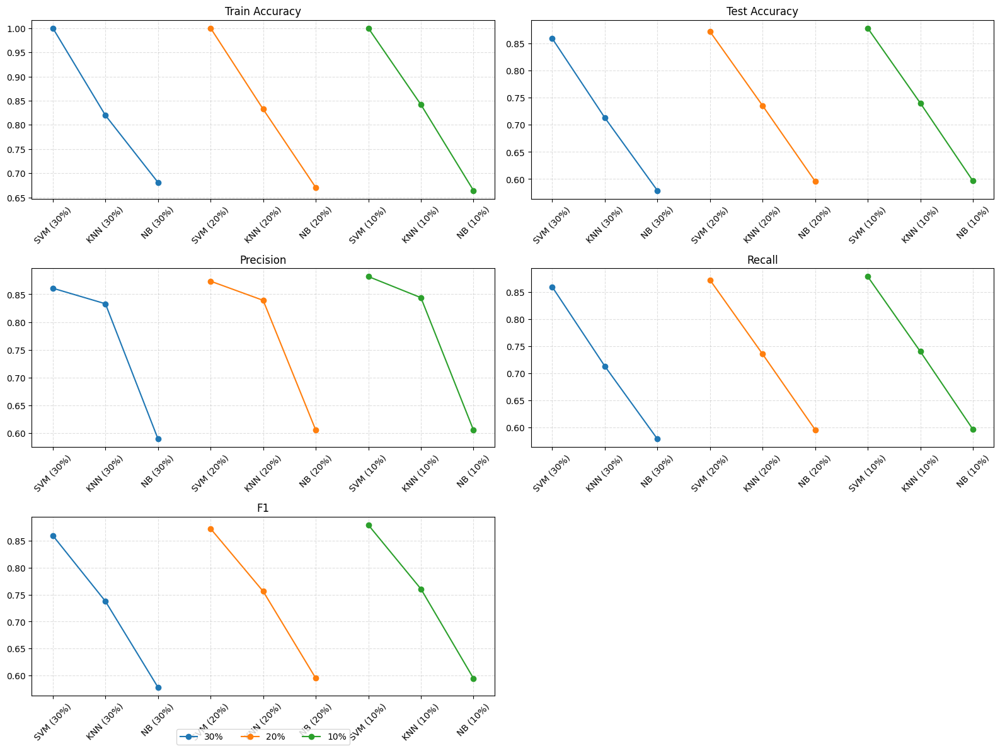

In [32]:
metrics = ["Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1"]

plt.figure(figsize=(16, 12))

for i, metric in enumerate(metrics, 1):
    plt.subplot(3, 2, i)

    for split in df_results["Split"].unique():
        subset = df_results[df_results["Split"] == split]
        x_labels = subset["Model"] + " (" + subset["Split"] + "%)"
        plt.plot(x_labels, subset[metric], marker='o', label=f"{split}%")

    plt.title(metric)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.4)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=3)
plt.tight_layout()
plt.show()
